## DS203 - Project

In [4]:
!git clone https://github.com/Harshvardhan-10/DS203-Project

Cloning into 'DS203-Project'...
remote: Enumerating objects: 268, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 268 (delta 0), reused 0 (delta 0), pack-reused 265 (from 1)
Receiving objects: 100% (268/268), 803.15 MiB | 13.31 MiB/s, done.
Resolving deltas: 100% (2/2), done.
Updating files: 100% (254/254), done.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
!pip install librosa soundfile --quiet

import librosa
import librosa.display
import soundfile as sf
import IPython.display as ipd

In [3]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
path = 'DS203-Project/MFCC-files-v2'

data = pd.read_csv(path+'/01-MFCC.csv')

In [ ]:
def show_data(data):
    plt.figure()
    plt.title("data")
    plt.plot(data)
    plt.show()

In [ ]:
# Load the MFCC data from the CSV file
mfccs = np.loadtxt(path+'/01-MFCC.csv', delimiter=',')

before transform  [-506.493   -506.493   -506.493   -506.493   -506.493   -506.493
 -506.493   -496.72305 -495.06165 -506.493  ]


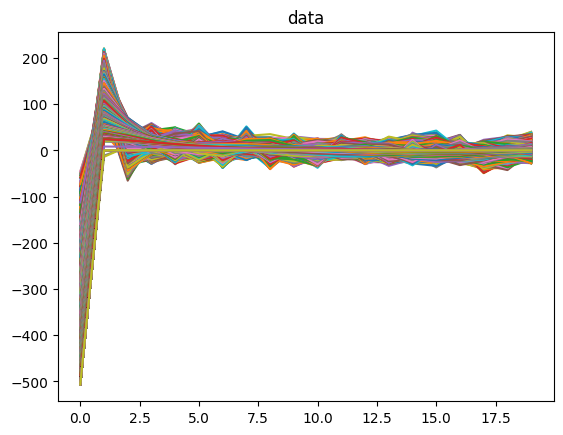

mfcc shape  (20, 9769)


In [ ]:
data = mfccs
print('before transform ', data[0][:10])
# scaler = MinMaxScaler(feature_range=(0, 1))
# scaler = scaler.fit(data)
# data = scaler.transform(data)

show_data(data)
print('mfcc shape ', data.shape)

In [ ]:
# data = scaler.inverse_transform(data)

# print('after inverse transform ', data[0][:10])

In [ ]:
# wav = librosa.feature.inverse.mfcc_to_audio(data[:][:325])
# show_data(wav)
# ipd.Audio(wav, rate=44100)

In [ ]:
# ipd.Audio(wav, rate=176400)

MFCC Shape: (20, 9769)
Number of MFCC coefficients: 20
Number of time frames: 9769
Approximate duration: 113.42 seconds


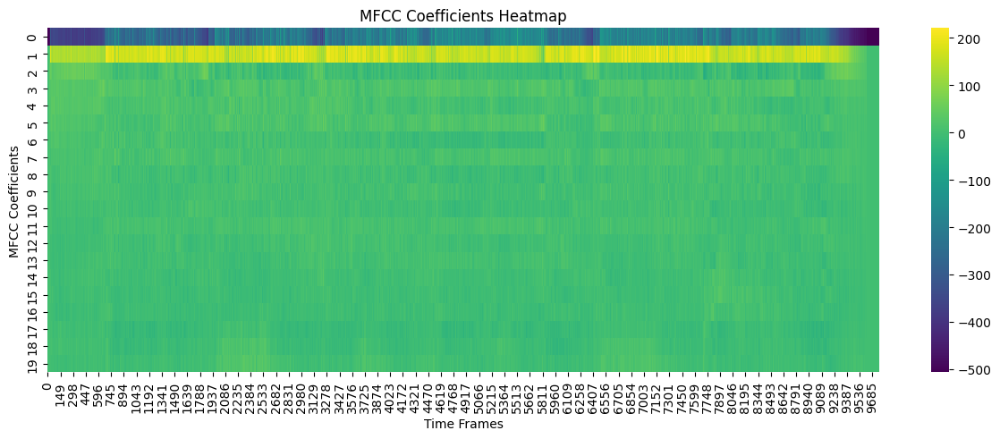

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def read_and_visualize_mfcc(file_path):
    # Read the MFCC CSV file
    mfcc_data = pd.read_csv(file_path, header=None)

    # Print basic information about the MFCC data
    print(f"MFCC Shape: {mfcc_data.shape}")
    print(f"Number of MFCC coefficients: {mfcc_data.shape[0]}")
    print(f"Number of time frames: {mfcc_data.shape[1]}")

    # Calculate approximate duration of the audio
    hop_size = 512
    sample_rate = 44100
    duration_seconds = (mfcc_data.shape[1] * hop_size) / sample_rate
    print(f"Approximate duration: {duration_seconds:.2f} seconds")

    # Create a heatmap visualization of the MFCC coefficients
    plt.figure(figsize=(15, 5))
    sns.heatmap(mfcc_data, cmap='viridis')
    plt.title('MFCC Coefficients Heatmap')
    plt.xlabel('Time Frames')
    plt.ylabel('MFCC Coefficients')
    plt.show()

    return mfcc_data

# Example usage:
mfcc_data = read_and_visualize_mfcc(path+'/01-MFCC.csv')

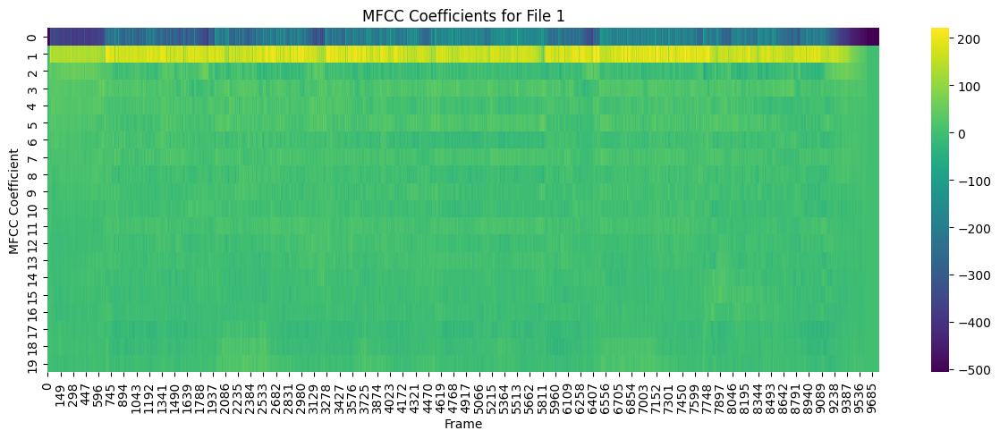

Features extracted for file 1:
mean: Shape (20,)
std: Shape (20,)
max: Shape (20,)
min: Shape (20,)
median: Shape (20,)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import glob
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

class MFCCAnalyzer:
    def __init__(self, data_directory):
        """
        Initialize the MFCC analyzer with the directory containing MFCC CSV files

        Parameters:
        data_directory (str): Path to directory containing MFCC CSV files
        """
        self.data_directory = Path(data_directory)
        self.mfcc_files = {}
        self.features = {}

    def load_mfcc_file(self, file_number):
        """
        Load a single MFCC file

        Parameters:
        file_number (int): The number of the MFCC file to load

        Returns:
        numpy.ndarray: The loaded MFCC data
        """
        if file_number < 100:
          file_path = self.data_directory / f"{file_number:02d}-MFCC.csv"
        else:
          file_path = self.data_directory / f"{file_number:03d}-MFCC.csv"
        try:
            mfcc_data = pd.read_csv(file_path, header=None).values
            self.mfcc_files[file_number] = mfcc_data
            return mfcc_data
        except FileNotFoundError:
            print(f"File {file_path} not found")
            return None

    def load_all_files(self):
        """Load all MFCC files from the directory"""
        pattern = str(self.data_directory / "*-MFCC.csv")
        for file_path in glob.glob(pattern):
            file_number = int(Path(file_path).stem.split('-')[0])
            self.load_mfcc_file(file_number)

    def visualize_mfcc(self, file_number):
        """
        Visualize MFCC coefficients for a single file

        Parameters:
        file_number (int): The number of the MFCC file to visualize
        """
        if file_number not in self.mfcc_files:
            self.load_mfcc_file(file_number)

        if file_number in self.mfcc_files:
            plt.figure(figsize=(15, 5))
            sns.heatmap(self.mfcc_files[file_number], cmap='viridis')
            plt.title(f'MFCC Coefficients for File {file_number}')
            plt.xlabel('Frame')
            plt.ylabel('MFCC Coefficient')
            plt.show()

    def extract_features(self, file_number):
        """
        Extract statistical features from MFCC data

        Parameters:
        file_number (int): The number of the MFCC file to analyze

        Returns:
        dict: Dictionary containing extracted features
        """
        if file_number not in self.mfcc_files:
            self.load_mfcc_file(file_number)

        if file_number in self.mfcc_files:
            mfcc_data = self.mfcc_files[file_number]
            features = {
                'mean': np.mean(mfcc_data, axis=1),
                'std': np.std(mfcc_data, axis=1),
                'max': np.max(mfcc_data, axis=1),
                'min': np.min(mfcc_data, axis=1),
                'median': np.median(mfcc_data, axis=1)
            }
            self.features[file_number] = features
            return features
        return None

# Example usage
if __name__ == "__main__":
    # Initialize analyzer (replace with your actual directory path)
    analyzer = MFCCAnalyzer(path)

    # Load and visualize a single file
    file_number = 1
    analyzer.load_mfcc_file(file_number)
    analyzer.visualize_mfcc(file_number)

    # Extract features
    features = analyzer.extract_features(file_number)
    if features:
        print(f"Features extracted for file {file_number}:")
        for feature_name, values in features.items():
            print(f"{feature_name}: Shape {values.shape}")

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import glob
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.stats import skew, kurtosis

class MFCCAnalyzer_new:
    def __init__(self, data_directory):
        self.data_directory = Path(data_directory)
        self.mfcc_files = {}
        self.features = {}
        self.feature_matrix = None
        self.pca_model = None

    def load_mfcc_file(self, file_number):
        """Previous load_mfcc_file implementation remains the same"""
        if file_number < 100:
          file_path = self.data_directory / f"{file_number:02d}-MFCC.csv"
        else:
          file_path = self.data_directory / f"{file_number:03d}-MFCC.csv"
        try:
            mfcc_data = pd.read_csv(file_path, header=None).values
            self.mfcc_files[file_number] = mfcc_data
            return mfcc_data
        except FileNotFoundError:
            print(f"File {file_path} not found")
            return None

    def extract_advanced_features(self, file_number):
        """
        Extract advanced statistical features from MFCC data
        """
        if file_number not in self.mfcc_files:
            self.load_mfcc_file(file_number)

        if file_number in self.mfcc_files:
            mfcc_data = self.mfcc_files[file_number]
            features = {
                'mean': np.mean(mfcc_data, axis=1),
                'std': np.std(mfcc_data, axis=1),
                'max': np.max(mfcc_data, axis=1),
                'min': np.min(mfcc_data, axis=1),
                'median': np.median(mfcc_data, axis=1),
                'skewness': skew(mfcc_data, axis=1),
                'kurtosis': kurtosis(mfcc_data, axis=1),
                'range': np.ptp(mfcc_data, axis=1),  # Peak-to-peak (range) values
                'q25': np.percentile(mfcc_data, 25, axis=1),  # First quartile
                'q75': np.percentile(mfcc_data, 75, axis=1)   # Third quartile
            }
            self.features[file_number] = features
            return features
        return None

    def build_feature_matrix(self):
        """
        Build a feature matrix for all loaded files
        """
        all_features = []
        file_numbers = []

        for file_num in self.mfcc_files.keys():
            features = self.extract_advanced_features(file_num)
            if features:
                # Flatten all features into a single vector
                feature_vector = np.concatenate([v for v in features.values()])
                all_features.append(feature_vector)
                file_numbers.append(file_num)

        self.feature_matrix = np.vstack(all_features)
        return self.feature_matrix, file_numbers

    def perform_clustering(self, n_clusters=6):
        """
        Perform clustering on the feature matrix
        """
        if self.feature_matrix is None:
            self.build_feature_matrix()

        # Standardize features
        scaler = StandardScaler()
        scaled_features = scaler.fit_transform(self.feature_matrix)

        # Reduce dimensionality with PCA
        self.pca_model = PCA(n_components=0.95)  # Preserve 95% of variance
        reduced_features = self.pca_model.fit_transform(scaled_features)

        # components = self.pca_model.components_
        # print(components)

        # Perform K-means clustering
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        clusters = kmeans.fit_predict(reduced_features)

        # Calculate silhouette score
        silhouette_avg = silhouette_score(reduced_features, clusters)

        return clusters, silhouette_avg, reduced_features

    def analyze_song_groups(self):
        """
        Analyze and group songs based on their features
        """
        clusters, silhouette_avg, reduced_features = self.perform_clustering()

        # Create a visualization of the clusters
        plt.figure(figsize=(12, 8))
        scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1],
                            c=clusters, cmap='viridis')
        plt.title('Song Clusters based on MFCC Features')
        plt.xlabel('First Principal Component')
        plt.ylabel('Second Principal Component')
        plt.colorbar(scatter)
        plt.show()

        # Return cluster assignments for each file
        return {file_num: cluster for file_num, cluster
                in zip(self.mfcc_files.keys(), clusters)}

In [ ]:
# Example usage
if __name__ == "__main__":
    path1 = 'DS203-Project/MFCC-files-v2'
    path2 = 'DS203-Project/MFCC-files'
    analyzer1 = MFCCAnalyzer_new(path1)
    analyzer2 = MFCCAnalyzer_new(path2)

    # Load several files
    for i in range(1, 117):  # Load first 9 files
        analyzer1.load_mfcc_file(i)

    # Load several files
    for i in range(1, 116):  # Load first 9 files
        analyzer2.load_mfcc_file(i)

    # Components contribution
    # components = analyzer.pca_model.components_
    # print(components)

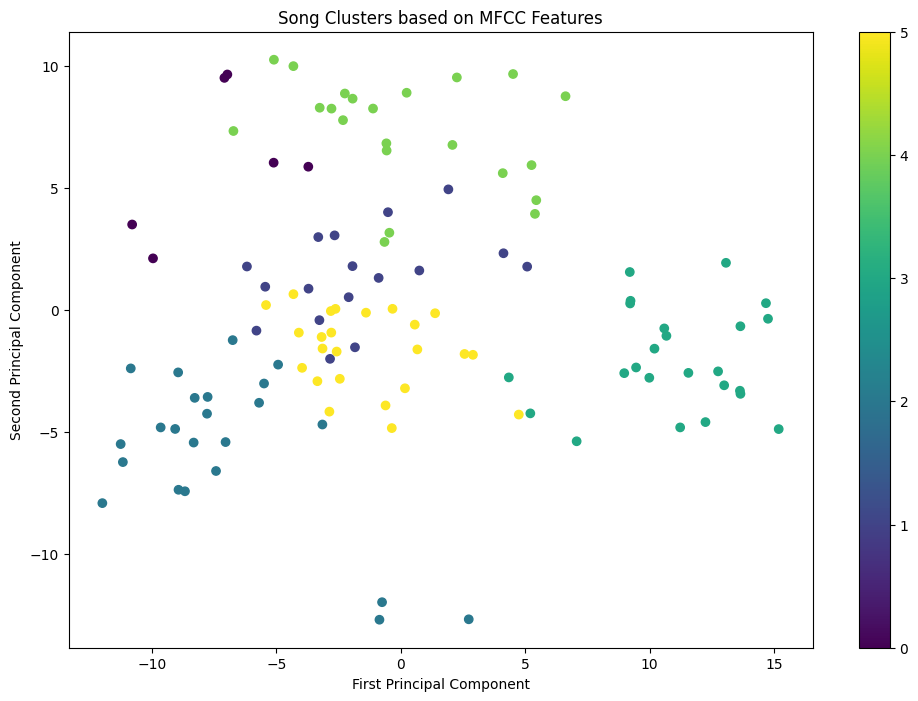

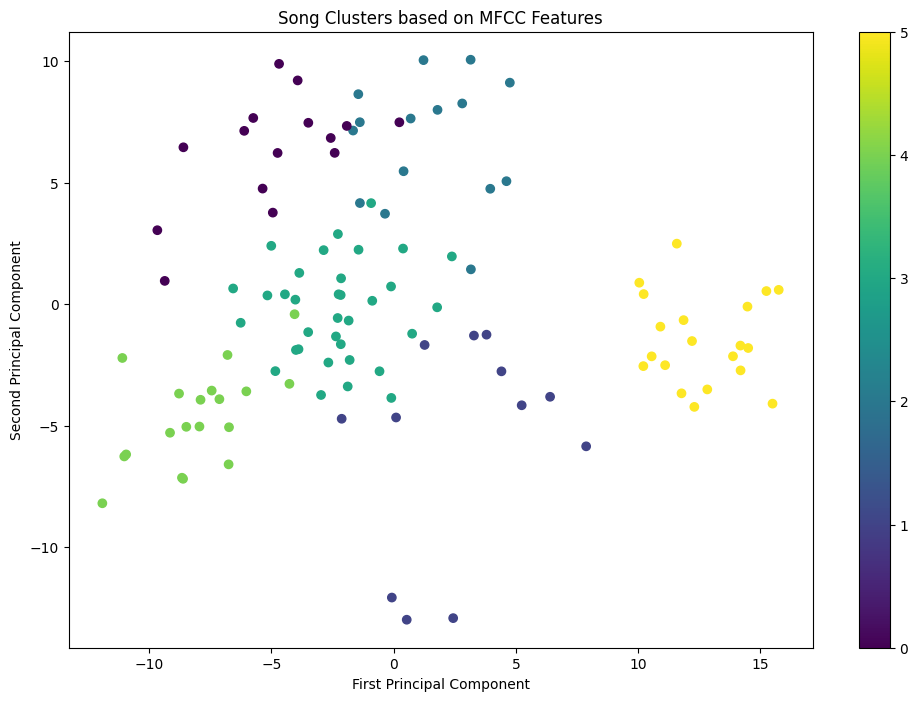


Cluster assignments 1: {1: 4, 2: 4, 3: 0, 4: 0, 5: 3, 6: 2, 7: 5, 8: 4, 9: 3, 10: 1, 11: 5, 12: 0, 13: 2, 14: 1, 15: 5, 16: 1, 17: 4, 18: 3, 19: 5, 20: 4, 21: 1, 22: 5, 23: 5, 24: 1, 25: 5, 26: 3, 27: 1, 28: 3, 29: 3, 30: 5, 31: 4, 32: 2, 33: 2, 34: 1, 35: 4, 36: 5, 37: 1, 38: 2, 39: 2, 40: 5, 41: 2, 42: 2, 43: 2, 44: 0, 45: 4, 46: 3, 47: 5, 48: 1, 49: 2, 50: 3, 51: 3, 52: 5, 53: 4, 54: 1, 55: 1, 56: 2, 57: 1, 58: 1, 59: 3, 60: 5, 61: 4, 62: 2, 63: 3, 64: 5, 65: 1, 66: 3, 67: 3, 68: 5, 69: 4, 70: 5, 71: 3, 72: 2, 73: 2, 74: 0, 75: 4, 76: 5, 77: 2, 78: 4, 79: 2, 80: 3, 81: 4, 82: 3, 83: 3, 84: 3, 85: 2, 86: 4, 87: 4, 88: 1, 89: 5, 90: 4, 91: 2, 92: 1, 93: 3, 94: 5, 95: 4, 96: 3, 97: 3, 98: 4, 99: 2, 100: 3, 101: 5, 102: 2, 103: 0, 104: 1, 105: 2, 106: 5, 107: 4, 108: 4, 109: 5, 110: 5, 111: 3, 112: 2, 113: 2, 114: 4, 115: 5, 116: 3}

Cluster assignments 2: {1: 2, 2: 2, 3: 0, 4: 0, 5: 5, 6: 3, 7: 1, 8: 0, 9: 5, 10: 4, 11: 3, 12: 0, 13: 4, 14: 3, 15: 3, 16: 2, 17: 2, 18: 5, 19: 3, 20: 0,

In [ ]:
    # Perform clustering analysis
    cluster_assignments_1 = analyzer1.analyze_song_groups()

    # Perform clustering analysis
    cluster_assignments_2 = analyzer2.analyze_song_groups()

    print("\nCluster assignments 1:", cluster_assignments_1)
    print("\nCluster assignments 2:", cluster_assignments_2)

In [ ]:
from collections import defaultdict

# Create a defaultdict to store keys by their values
value_to_keys = defaultdict(list)

# Group the keys by their values
for key, value in cluster_assignments_1.items():
    value_to_keys[value].append(key)

# Print keys that have the same values
for value, keys in value_to_keys.items():
    # Only consider values with more than one key
    print(f"Value {value} is shared by keys: {keys}")

Value 4 is shared by keys: [1, 2, 8, 17, 20, 31, 35, 45, 53, 61, 69, 75, 78, 81, 86, 87, 90, 95, 98, 107, 108, 114]
Value 0 is shared by keys: [3, 4, 12, 44, 74, 103]
Value 3 is shared by keys: [5, 9, 18, 26, 28, 29, 46, 50, 51, 59, 63, 66, 67, 71, 80, 82, 83, 84, 93, 96, 97, 100, 111, 116]
Value 2 is shared by keys: [6, 13, 32, 33, 38, 39, 41, 42, 43, 49, 56, 62, 72, 73, 77, 79, 85, 91, 99, 102, 105, 112, 113]
Value 5 is shared by keys: [7, 11, 15, 19, 22, 23, 25, 30, 36, 40, 47, 52, 60, 64, 68, 70, 76, 89, 94, 101, 106, 109, 110, 115]
Value 1 is shared by keys: [10, 14, 16, 21, 24, 27, 34, 37, 48, 54, 55, 57, 58, 65, 88, 92, 104]


In [ ]:
from collections import defaultdict

# Create a defaultdict to store keys by their values
value_to_keys = defaultdict(list)

# Group the keys by their values
for key, value in cluster_assignments_2.items():
    value_to_keys[value].append(key)

# Print keys that have the same values
for value, keys in value_to_keys.items():
    # Only consider values with more than one key
    print(f"Value {value} is shared by keys: {keys}")

Value 2 is shared by keys: [1, 2, 16, 17, 27, 31, 35, 61, 75, 81, 87, 90, 95, 107, 108]
Value 0 is shared by keys: [3, 4, 8, 12, 20, 44, 45, 53, 69, 74, 78, 86, 98, 103, 114]
Value 5 is shared by keys: [5, 9, 18, 26, 28, 29, 46, 50, 51, 59, 63, 66, 67, 83, 84, 93, 96, 97, 100, 111]
Value 3 is shared by keys: [6, 11, 14, 15, 19, 21, 22, 24, 25, 30, 34, 36, 37, 42, 49, 52, 54, 55, 57, 58, 64, 65, 68, 70, 73, 76, 88, 89, 92, 94, 104, 106, 109, 115]
Value 1 is shared by keys: [7, 23, 38, 40, 60, 71, 80, 82, 101, 102, 105, 110]
Value 4 is shared by keys: [10, 13, 32, 33, 39, 41, 43, 47, 48, 56, 62, 72, 77, 79, 85, 91, 99, 112, 113]


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import glob
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.stats import skew, kurtosis

class MFCCAnalyzer_multi:
    def __init__(self, data_directory):
        self.data_directory = Path(data_directory)
        self.mfcc_files = {}
        self.features = {}
        self.feature_matrix = None
        self.pca_model = None
        self.scaled_features = None
        self.reduced_features = None

    def load_mfcc_file(self, file_number):
        """Previous load_mfcc_file implementation remains the same"""
        if file_number < 100:
          file_path = self.data_directory / f"{file_number:02d}-MFCC.csv"
        else:
          file_path = self.data_directory / f"{file_number:03d}-MFCC.csv"
        try:
            mfcc_data = pd.read_csv(file_path, header=None).values
            self.mfcc_files[file_number] = mfcc_data
            return mfcc_data
        except FileNotFoundError:
            print(f"File {file_path} not found")
            return None

    def extract_advanced_features(self, file_number):
        """Previous extract_advanced_features implementation remains the same"""
        if file_number not in self.mfcc_files:
            self.load_mfcc_file(file_number)

        if file_number in self.mfcc_files:
            mfcc_data = self.mfcc_files[file_number]
            features = {
                'mean': np.mean(mfcc_data, axis=1),
                'std': np.std(mfcc_data, axis=1),
                'max': np.max(mfcc_data, axis=1),
                'min': np.min(mfcc_data, axis=1),
                'median': np.median(mfcc_data, axis=1),
                'skewness': skew(mfcc_data, axis=1),
                'kurtosis': kurtosis(mfcc_data, axis=1),
                'range': np.ptp(mfcc_data, axis=1),  # Peak-to-peak (range) values
                'q25': np.percentile(mfcc_data, 25, axis=1),  # First quartile
                'q75': np.percentile(mfcc_data, 75, axis=1)   # Third quartile
            }
            self.features[file_number] = features
            return features
        return None

    def build_feature_matrix(self):
        """Previous build_feature_matrix implementation remains the same"""
        all_features = []
        file_numbers = []

        for file_num in self.mfcc_files.keys():
            features = self.extract_advanced_features(file_num)
            if features:
                # Flatten all features into a single vector
                feature_vector = np.concatenate([v for v in features.values()])
                all_features.append(feature_vector)
                file_numbers.append(file_num)

        self.feature_matrix = np.vstack(all_features)
        return self.feature_matrix, file_numbers

    def perform_clustering(self, method='kmeans', n_clusters=6, **kwargs):
        """
        Perform clustering on the feature matrix with multiple methods

        Parameters:
        -----------
        method : str, optional (default='kmeans')
            Clustering method to use. Options:
            - 'kmeans': K-means clustering
            - 'dbscan': DBSCAN clustering
            - 'hierarchical': Agglomerative (Hierarchical) Clustering

        n_clusters : int, optional (default=6)
            Number of clusters for K-means and Hierarchical clustering

        **kwargs : dict
            Additional arguments to pass to the clustering algorithm

        Returns:
        --------
        clusters : numpy.ndarray
            Cluster labels for each data point
        silhouette_avg : float
            Silhouette score of the clustering
        reduced_features : numpy.ndarray
            Reduced feature space after PCA
        """
        if self.feature_matrix is None:
            self.build_feature_matrix()

        # Standardize features
        scaler = StandardScaler()
        scaled_features = scaler.fit_transform(self.feature_matrix)
        self.scaled_features = scaled_features

        # Reduce dimensionality with PCA
        self.pca_model = PCA(n_components=0.95)  # Preserve 95% of variance
        reduced_features = self.pca_model.fit_transform(scaled_features)
        self.reduced_features = reduced_features

        # Choose clustering method
        if method == 'kmeans':
            clusterer = KMeans(n_clusters=n_clusters, random_state=42, **kwargs)
            clusters = clusterer.fit_predict(reduced_features)

        elif method == 'dbscan':
            # DBSCAN doesn't require specifying number of clusters
            # Use eps and min_samples for density-based clustering
            default_kwargs = {'eps': 0.5, 'min_samples': 3}
            default_kwargs.update(kwargs)
            clusterer = DBSCAN(**default_kwargs)
            clusters = clusterer.fit_predict(reduced_features)

        elif method == 'hierarchical':
            clusterer = AgglomerativeClustering(n_clusters=n_clusters, **kwargs)
            clusters = clusterer.fit_predict(reduced_features)

        else:
            raise ValueError(f"Unsupported clustering method: {method}")

        # Calculate silhouette score (only for methods with defined clusters)
        # if method != 'dbscan':
        silhouette_avg = silhouette_score(reduced_features, clusters)
        # else:
        #     # For DBSCAN, which can have noise points (labeled -1)
        #     # we'll calculate silhouette score excluding noise points
        #     mask = clusters != -1
        #     silhouette_avg = silhouette_score(reduced_features[mask], clusters[mask])

        return clusters, silhouette_avg, reduced_features

    def analyze_song_groups(self, method='kmeans', **kwargs):
        """
        Analyze and group songs based on their features using specified clustering method
        """
        clusters, silhouette_avg, reduced_features = self.perform_clustering(method, **kwargs)

        # Create a visualization of the clusters
        plt.figure(figsize=(12, 8))
        scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1],
                            c=clusters, cmap='viridis')
        plt.title(f'Song Clusters based on MFCC Features ({method.capitalize()} Clustering)')
        plt.xlabel('First Principal Component')
        plt.ylabel('Second Principal Component')
        plt.colorbar(scatter)
        plt.show()

        # Return cluster assignments for each file
        return {file_num: cluster for file_num, cluster
                in zip(self.mfcc_files.keys(), clusters)}

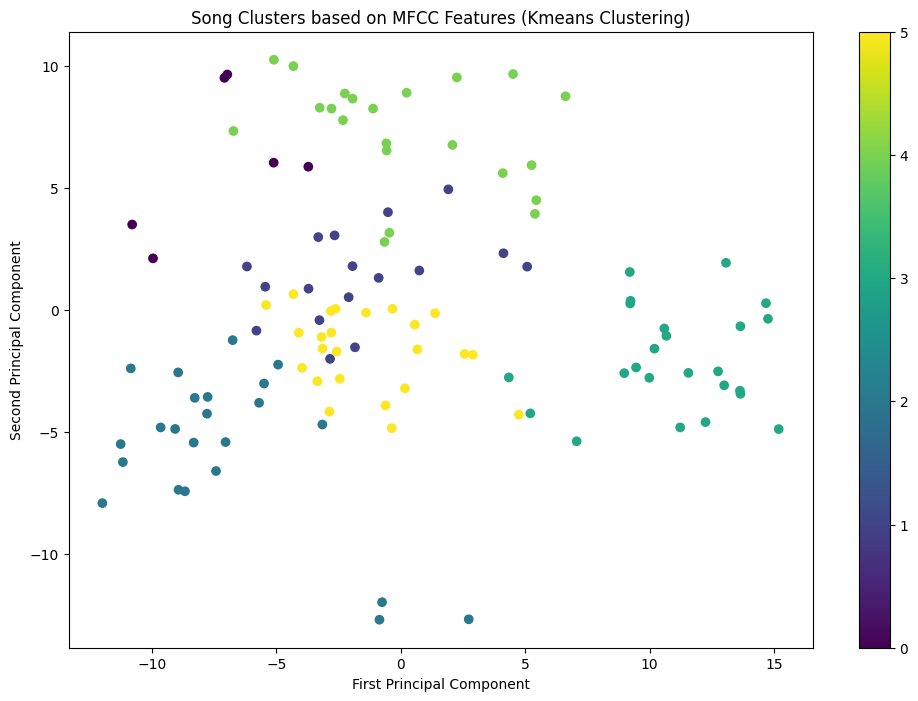

In [ ]:
if __name__ == "__main__":
    path1 = 'DS203-Project/MFCC-files-v2'
    path2 = 'DS203-Project/MFCC-files'
    analyzer1 = MFCCAnalyzer_multi(path1)
    analyzer2 = MFCCAnalyzer_multi(path2)

    # Load several files
    for i in range(1, 117):  # Load first 9 files
        analyzer1.load_mfcc_file(i)

    # Load several files
    # for i in range(1, 116):  # Load first 9 files
    #     analyzer2.load_mfcc_file(i)

    # Perform clustering analysis
    cluster_assignments_kmeans = analyzer1.analyze_song_groups()



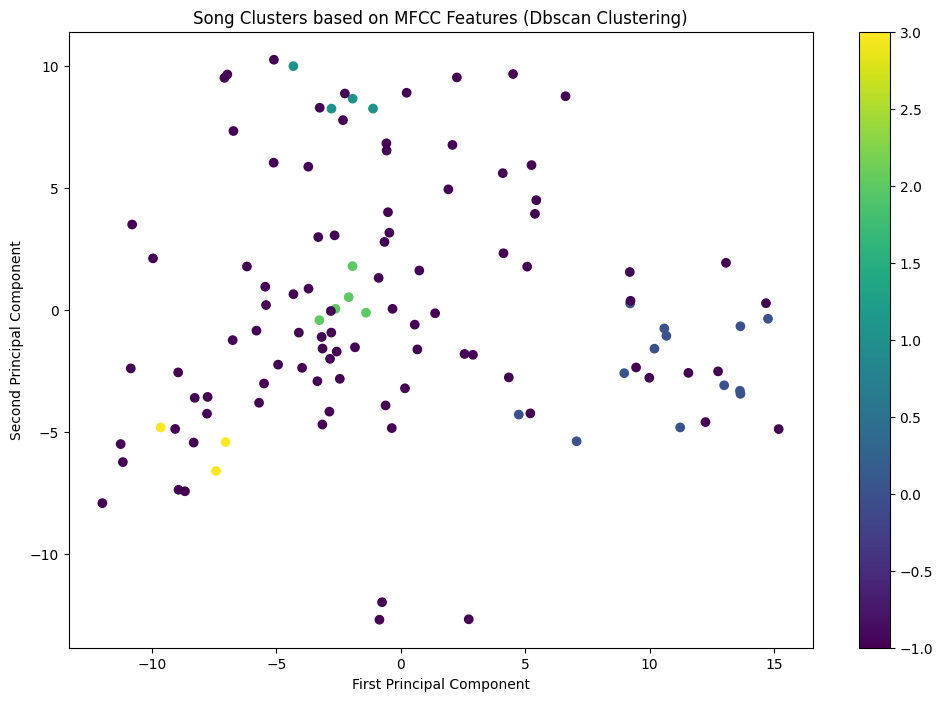

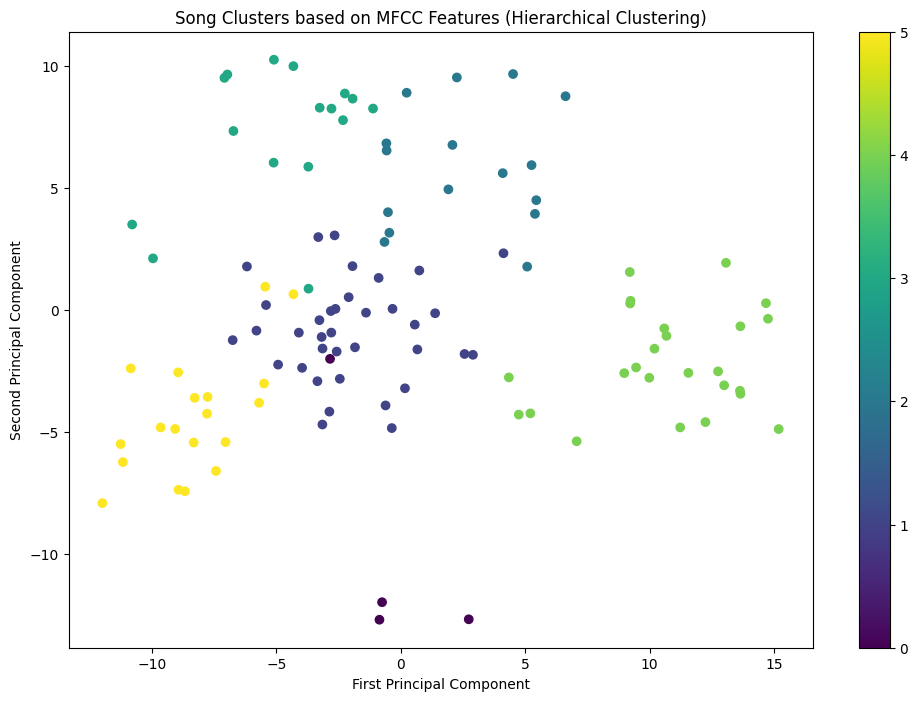

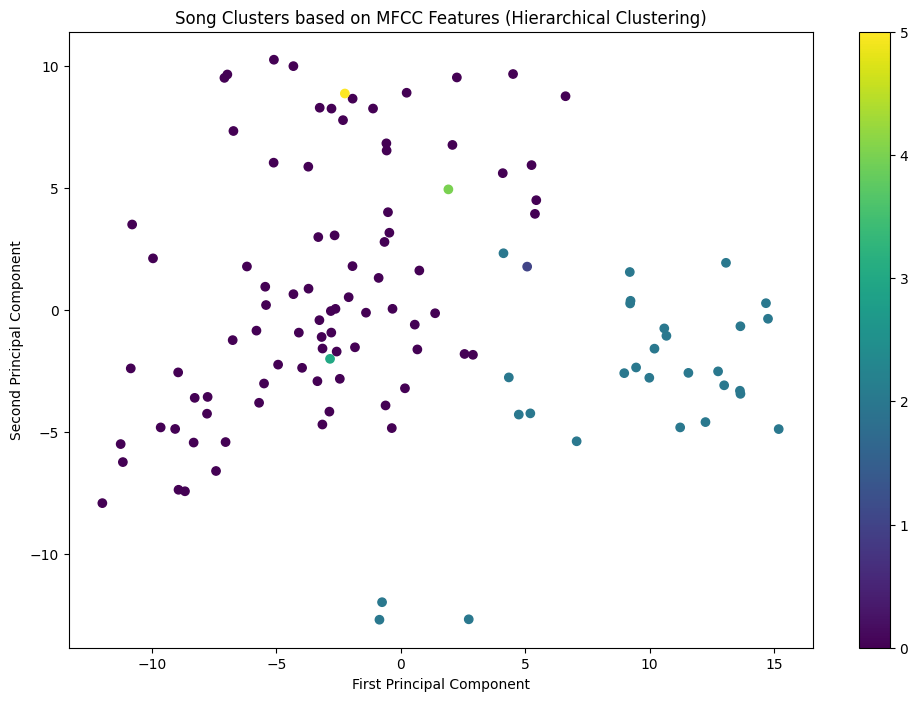

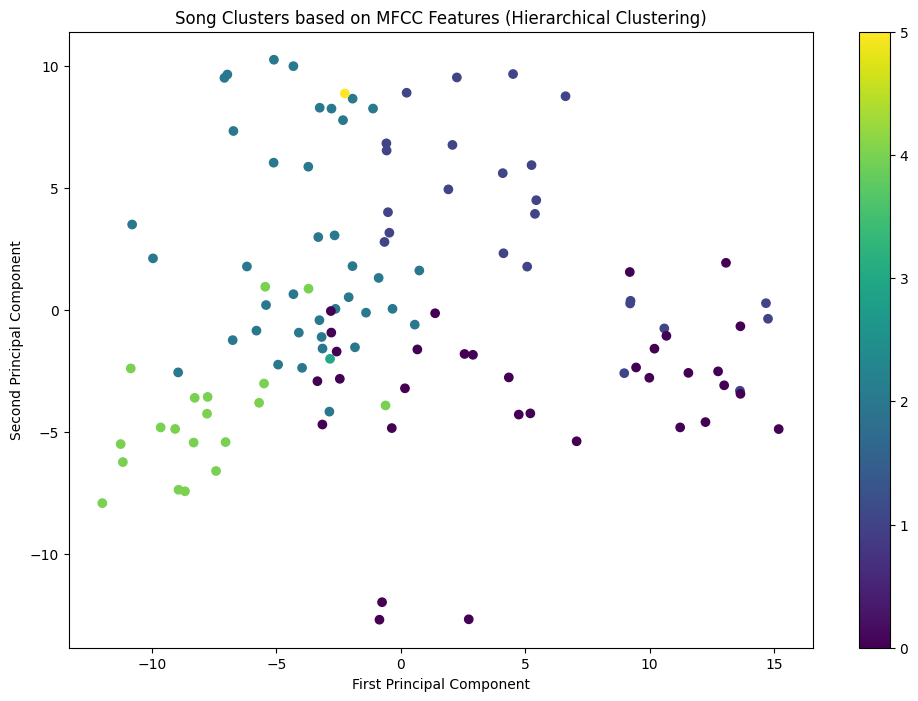


Cluster assignments KMeans: {1: 4, 2: 4, 3: 0, 4: 0, 5: 3, 6: 2, 7: 5, 8: 4, 9: 3, 10: 1, 11: 5, 12: 0, 13: 2, 14: 1, 15: 5, 16: 1, 17: 4, 18: 3, 19: 5, 20: 4, 21: 1, 22: 5, 23: 5, 24: 1, 25: 5, 26: 3, 27: 1, 28: 3, 29: 3, 30: 5, 31: 4, 32: 2, 33: 2, 34: 1, 35: 4, 36: 5, 37: 1, 38: 2, 39: 2, 40: 5, 41: 2, 42: 2, 43: 2, 44: 0, 45: 4, 46: 3, 47: 5, 48: 1, 49: 2, 50: 3, 51: 3, 52: 5, 53: 4, 54: 1, 55: 1, 56: 2, 57: 1, 58: 1, 59: 3, 60: 5, 61: 4, 62: 2, 63: 3, 64: 5, 65: 1, 66: 3, 67: 3, 68: 5, 69: 4, 70: 5, 71: 3, 72: 2, 73: 2, 74: 0, 75: 4, 76: 5, 77: 2, 78: 4, 79: 2, 80: 3, 81: 4, 82: 3, 83: 3, 84: 3, 85: 2, 86: 4, 87: 4, 88: 1, 89: 5, 90: 4, 91: 2, 92: 1, 93: 3, 94: 5, 95: 4, 96: 3, 97: 3, 98: 4, 99: 2, 100: 3, 101: 5, 102: 2, 103: 0, 104: 1, 105: 2, 106: 5, 107: 4, 108: 4, 109: 5, 110: 5, 111: 3, 112: 2, 113: 2, 114: 4, 115: 5, 116: 3}

Cluster assignments DBSCAN: {1: -1, 2: -1, 3: -1, 4: -1, 5: 0, 6: -1, 7: -1, 8: 1, 9: 0, 10: -1, 11: -1, 12: -1, 13: 3, 14: -1, 15: -1, 16: -1, 17: -

In [ ]:
# Perform clustering analysis

# DBSCAN not working well with current features matrix
cluster_assignments_dbscan = analyzer1.analyze_song_groups(method='dbscan', eps=9.3, min_samples=3)

cluster_assignments_hierarchical_ward = analyzer1.analyze_song_groups(method='hierarchical', linkage = 'ward')

cluster_assignments_hierarchical_average = analyzer1.analyze_song_groups(method='hierarchical', linkage = 'average')

cluster_assignments_hierarchical_complete = analyzer1.analyze_song_groups(method='hierarchical', linkage = 'complete')

print("\nCluster assignments KMeans:", cluster_assignments_kmeans)
print("\nCluster assignments DBSCAN:", cluster_assignments_dbscan)
print('\nCluster assignments Hierarchical:', cluster_assignments_hierarchical_ward)
print('\nCluster assignments Hierarchical:', cluster_assignments_hierarchical_average)
print('\nCluster assignments Hierarchical:', cluster_assignments_hierarchical_complete)

In [ ]:
# print(pd.DataFrame(analyzer1.feature_matrix))

feat_name = ['mean',
'std',
'max',
'min',
'median',
'skewness',
'kurtosis',
'range',
'q25',
'q75' ]

# feature_names = []

# for i in range(20):
#     for j in range(len(feat_name)):
#         feature_names.append(f'{feat_name[j]}_coeff_{i}')

features = pd.DataFrame(analyzer1.feature_matrix)
# features.columns = feature_names
scaled_features = pd.DataFrame(analyzer1.scaled_features)
reduced_features = pd.DataFrame(analyzer1.reduced_features)

print(features)
print(scaled_features)
print(reduced_features)

            0           1          2          3          4          5    \
0   -237.718662  158.862379   1.755189  17.292726   9.288440  12.593411   
1   -235.843724  147.083847  -8.683156  32.924666   2.918975  27.383487   
2   -150.180663  126.286241 -45.660072  27.686529  -9.114286  16.048515   
3   -250.229521   91.387647 -51.730821  52.862679 -12.547937  27.305643   
4   -254.277604  204.579974 -47.367582   6.151538  26.695898  -9.915818   
..          ...         ...        ...        ...        ...        ...   
111 -168.654064  120.398800 -51.982064  62.122929  -7.443177   7.895173   
112 -167.876621  115.052710 -41.865068  54.096183 -14.122588  10.780855   
113 -172.662519  144.679293  10.357489  44.934812 -11.137970  19.137407   
114 -257.265754  158.381123 -21.025812  24.797197   8.964247   7.205622   
115 -446.827918  147.439900 -11.771916  13.113227  11.845566  -6.243414   

           6          7          8          9    ...       190        191  \
0    -0.657665   8.882

In [ ]:
plt.figure(figsize = (40,40))
sns.pairplot(reduced_features)
plt.show()

<Figure size 4000x4000 with 0 Axes>

# Supervised Learning for MFCC features


In [107]:
labelled_data = pd.read_csv('MFCC-song_list - Sheet3.csv')

In [108]:
labelled_data

,Song ID,Singer,File Path,CLUSTER ID
0,1,Anthem,DS203-Project/MFCC-files-v2/01-MFCC.csv,2.0
1,2,Anthem,DS203-Project/MFCC-files-v2/02-MFCC.csv,2.0
2,3,Michael Jackson,DS203-Project/MFCC-files-v2/03-MFCC.csv,0.0
3,4,Asha Bhosale,DS203-Project/MFCC-files-v2/04-MFCC.csv,3.0
4,5,Kishore Kumar,DS203-Project/MFCC-files-v2/05-MFCC.csv,5.0
...,...,...,...,...
111,112,Bhav geet,DS203-Project/MFCC-files-v2/112-MFCC.csv,4.0
112,113,Bhav geet,DS203-Project/MFCC-files-v2/113-MFCC.csv,4.0
113,114,Michael Jackson,DS203-Project/MFCC-files-v2/114-MFCC.csv,0.0
114,115,asha,DS203-Project/MFCC-files-v2/115-MFCC.csv,3.0


In [109]:
labelled_data.drop(columns = 'Song ID', inplace=True)

In [110]:
labelled_data

,Singer,File Path,CLUSTER ID
0,Anthem,DS203-Project/MFCC-files-v2/01-MFCC.csv,2.0
1,Anthem,DS203-Project/MFCC-files-v2/02-MFCC.csv,2.0
2,Michael Jackson,DS203-Project/MFCC-files-v2/03-MFCC.csv,0.0
3,Asha Bhosale,DS203-Project/MFCC-files-v2/04-MFCC.csv,3.0
4,Kishore Kumar,DS203-Project/MFCC-files-v2/05-MFCC.csv,5.0
...,...,...,...
111,Bhav geet,DS203-Project/MFCC-files-v2/112-MFCC.csv,4.0
112,Bhav geet,DS203-Project/MFCC-files-v2/113-MFCC.csv,4.0
113,Michael Jackson,DS203-Project/MFCC-files-v2/114-MFCC.csv,0.0
114,asha,DS203-Project/MFCC-files-v2/115-MFCC.csv,3.0


In [120]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import glob
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.stats import skew, kurtosis
from tqdm import tqdm
import os
from sklearn.manifold import TSNE

class testing:
    def __init__(self):
        # self.data_directory = Path(data_directory)
        self.mfcc_files = {}
        self.features = {}
        self.feature_matrix = None
        self.pca_model = None
        self.scaled_features = None
        self.reduced_features = None

    def load_mfcc_files(self, file_paths):
        for idx, file_path in enumerate(tqdm(file_paths, desc='Processing file')):
          try:
              mfcc_data = pd.read_csv(file_path, header=None).values
              self.mfcc_files[idx+1] = mfcc_data
          except FileNotFoundError:
              print(f"File {file_path} not found")
              return None

    def extract_advanced_features(self, file_number):
        """Previous extract_advanced_features implementation remains the same"""
        if file_number not in self.mfcc_files:
            self.load_mfcc_file(file_number)

        if file_number in self.mfcc_files:
            mfcc_data = self.mfcc_files[file_number]
            features = {
                'mean': np.mean(mfcc_data, axis=1),
                'std': np.std(mfcc_data, axis=1),
                'max': np.max(mfcc_data, axis=1),
                'min': np.min(mfcc_data, axis=1),
                'median': np.median(mfcc_data, axis=1),
                'skewness': skew(mfcc_data, axis=1),
                'kurtosis': kurtosis(mfcc_data, axis=1),
                'range': np.ptp(mfcc_data, axis=1),  # Peak-to-peak (range) values
                'q25': np.percentile(mfcc_data, 25, axis=1),  # First quartile
                'q75': np.percentile(mfcc_data, 75, axis=1)   # Third quartile
            }
            self.features[file_number] = features
            return features
        return None

    def build_feature_matrix(self):
        """Previous build_feature_matrix implementation remains the same"""
        all_features = []
        file_numbers = []

        for file_num in self.mfcc_files.keys():
            features = self.extract_advanced_features(file_num)
            if features:
                # Flatten all features into a single vector
                feature_vector = np.concatenate([v for v in features.values()])
                all_features.append(feature_vector)
                file_numbers.append(file_num)

        self.feature_matrix = np.vstack(all_features)
        return self.feature_matrix, file_numbers

    def dim_red(self):
        if self.feature_matrix is None:
                self.build_feature_matrix()

        # Standardize features
        scaler = StandardScaler()
        scaled_features = scaler.fit_transform(self.feature_matrix)
        self.scaled_features = scaled_features

        # Reduce dimensionality with PCA
        self.pca_model = PCA(n_components=0.95)  # Preserve 95% of variance
        reduced_features = self.pca_model.fit_transform(scaled_features)
        self.reduced_features = reduced_features
        tsne = TSNE(n_components=2, random_state=42)
        tsne_features = tsne.fit_transform(scaled_features)
        return reduced_features, tsne_features

    def analyze_songs(self, labels, file_paths):
        """
        Analyze and group songs based on their features using specified clustering method
        """
        if self.feature_matrix is None:
              self.build_feature_matrix()
        print(self.feature_matrix)
        # Standardize features
        scaler = StandardScaler()
        scaled_features = scaler.fit_transform(self.feature_matrix)
        self.scaled_features = scaled_features

        # Reduce dimensionality with PCA
        self.pca_model = PCA(n_components=0.95)  # Preserve 95% of variance
        reduced_features = self.pca_model.fit_transform(scaled_features)
        self.reduced_features = reduced_features

        fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(20, 8))
        scatter1 = ax1.scatter(reduced_features[:, 0], reduced_features[:, 1],
                          c=labels, cmap='viridis')
        ax1.set_title(f'PCA Visualization')

        tsne = TSNE(n_components=2, random_state=42)
        tsne_features = tsne.fit_transform(scaled_features)
        # t-SNE plot
        scatter2 = ax2.scatter(tsne_features[:, 0], tsne_features[:, 1],
                              c=labels, cmap='viridis')
        ax2.set_title(f't-SNE Visualization')

        # Add legend
        legend_elements = [
            plt.Line2D([0], [0], marker='o', color='w', label='Michael Jackson',
                      markerfacecolor=scatter1.cmap(scatter1.norm(0)), markersize=10),
            plt.Line2D([0], [0], marker='o', color='w', label='Lavni',
                      markerfacecolor=scatter1.cmap(scatter1.norm(1)), markersize=10),
            plt.Line2D([0], [0], marker='o', color='w', label='Anthem',
                      markerfacecolor=scatter1.cmap(scatter1.norm(2)), markersize=10),
            plt.Line2D([0], [0], marker='o', color='w', label='Asha Bhosale',
                      markerfacecolor=scatter1.cmap(scatter1.norm(3)), markersize=10),
            plt.Line2D([0], [0], marker='o', color='w', label='Bhaav Geet',
                      markerfacecolor=scatter1.cmap(scatter1.norm(4)), markersize=10),
            plt.Line2D([0], [0], marker='o', color='w', label='Kishore Kumar',
                      markerfacecolor=scatter1.cmap(scatter1.norm(5)), markersize=10),
        ]

        ax1.legend(handles=legend_elements, loc='best')  # Add to first plot
        ax2.legend(handles=legend_elements, loc='best')  # Add to second plot

        # Add file names as annotations
        for i, file in enumerate(file_paths):
            file = os.path.basename(file).split('-')[0]
            ax1.annotate(file, (reduced_features[i, 0], reduced_features[i, 1]),
                        fontsize=8, alpha=0.7)
            ax2.annotate(file, (tsne_features[i, 0], tsne_features[i, 1]),
                        fontsize=8, alpha=0.7)
        plt.show()

        # Return cluster assignments for each file
        return reduced_features, tsne_features
        # # Return cluster assignments for each file
        # return {file_num: cluster for file_num, cluster
        #         in zip(self.mfcc_files.keys(), clusters)}

In [121]:
y = labelled_data['CLUSTER ID']
y_dash = y.dropna()
file_paths = labelled_data[labelled_data['CLUSTER ID'] >=0]['File Path']
file_paths.shape

(89,)

Processing file: 100%|██████████| 89/89 [00:56<00:00,  1.57it/s]


[[-237.7186617   158.86237878    1.75518868 ...   -4.1357837
     0.53178966    4.913619  ]
 [-235.84372449  147.08384711   -8.6831557  ...    6.8860245
     3.6249084    -1.8169918 ]
 [-150.18066296  126.28624117  -45.66007227 ...    1.9092482
     5.1823454     3.1418967 ]
 ...
 [-172.66251893  144.67929273   10.3574889  ...    1.6696835
     6.45059       1.3894929 ]
 [-257.2657544   158.38112316  -21.02581201 ...    9.131464
    11.481878     13.090911  ]
 [-446.82791786  147.43990009  -11.77191627 ...    5.29490185
     4.62943075   -2.00869445]]


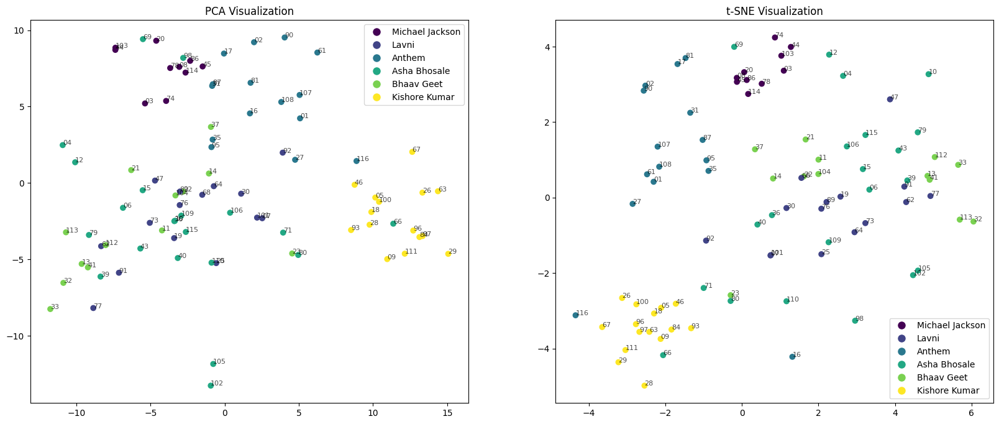

In [122]:
if __name__ == "__main__":
    analyzer1 = testing()

    analyzer1.load_mfcc_files(file_paths)
    reduced_features, tsne_red_features = analyzer1.analyze_songs(y_dash, file_paths)

In [134]:
y_dash.value_counts()

,count
CLUSTER ID,
3.0,21
2.0,15
5.0,15
1.0,15
4.0,13
0.0,10


In [161]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

# Assuming 'reduced_features' and 'y_dash' are already defined
# from your previous code

# 1. Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    reduced_features, y_dash, test_size=0.4, random_state=42
)

# print(y_train.value_counts(, zero_division=0))

from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import SMOTE  # Example oversampling method

# Create an oversampler (e.g., SMOTE)
oversampler = SMOTE(random_state=42, k_neighbors=3)

# Resample the data
X_resampled, y_resampled = oversampler.fit_resample(X_train, y_train)

# 2. Initialize and train the Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_resampled, y_resampled)

# 3. Make predictions using Random Forest
rf_predictions = rf_classifier.predict(X_test)

# 4. Evaluate Random Forest performance
rf_accuracy = accuracy_score(y_test, rf_predictions)
print(f"Random Forest Accuracy: {rf_accuracy}")
print(classification_report(y_test, rf_predictions, zero_division=0))

xgb_classifier = XGBClassifier(random_state=42)
xgb_classifier.fit(X_resampled, y_resampled)

# 5. Make predictions using XGBoost
xgb_predictions = xgb_classifier.predict(X_test)

# 6. Evaluate XGBoost performance
xgb_accuracy = accuracy_score(y_test, xgb_predictions)
print(f"XGBoost Accuracy: {xgb_accuracy}")
print(classification_report(y_test, xgb_predictions, zero_division=0))

# 5. Initialize and train the SVM classifier
svm_classifier = SVC(random_state=42)
svm_classifier.fit(X_resampled, y_resampled)

# 6. Make predictions using SVM
svm_predictions = svm_classifier.predict(X_test)

# 7. Evaluate SVM performance
svm_accuracy = accuracy_score(y_test, svm_predictions)
print(f"SVM Accuracy: {svm_accuracy}")
print(classification_report(y_test, svm_predictions, zero_division=0))


# Initialize and train Logistic Regression
logreg_classifier = LogisticRegression(random_state=42, max_iter=100000)
logreg_classifier.fit(X_resampled, y_resampled)

# Make predictions and evaluate
logreg_predictions = logreg_classifier.predict(X_test)
logreg_accuracy = accuracy_score(y_test, logreg_predictions)
print(f"Logistic Regression Accuracy: {logreg_accuracy}")
print(classification_report(y_test, logreg_predictions, zero_division=0))

# Initialize and train KNN
knn_classifier = KNeighborsClassifier(n_neighbors=3)  # Adjust n_neighbors
knn_classifier.fit(X_resampled, y_resampled)

# Make predictions and evaluate
knn_predictions = knn_classifier.predict(X_test)
knn_accuracy = accuracy_score(y_test, knn_predictions)
print(f"KNN Accuracy: {knn_accuracy}")
print(classification_report(y_test, knn_predictions, zero_division=0))


# Initialize and train Decision Tree
dt_classifier = DecisionTreeClassifier(random_state=42)
dt_classifier.fit(X_resampled, y_resampled)

# Make predictions and evaluate
dt_predictions = dt_classifier.predict(X_test)
dt_accuracy = accuracy_score(y_test, dt_predictions)
print(f"Decision Tree Accuracy: {dt_accuracy}")
print(classification_report(y_test, dt_predictions, zero_division=0))


# Initialize and train Naive Bayes
nb_classifier = GaussianNB()
nb_classifier.fit(X_resampled, y_resampled)

# Make predictions and evaluate
nb_predictions = nb_classifier.predict(X_test)
nb_accuracy = accuracy_score(y_test, nb_predictions)
print(f"Naive Bayes Accuracy: {nb_accuracy}")
print(classification_report(y_test, nb_predictions, zero_division=0))

Random Forest Accuracy: 0.5
              precision    recall  f1-score   support

         0.0       0.67      0.33      0.44         6
         1.0       0.40      0.33      0.36         6
         2.0       0.44      1.00      0.62         4
         3.0       0.33      0.38      0.35         8
         4.0       0.50      0.29      0.36         7
         5.0       0.83      1.00      0.91         5

    accuracy                           0.50        36
   macro avg       0.53      0.55      0.51        36
weighted avg       0.51      0.50      0.48        36

XGBoost Accuracy: 0.4166666666666667
              precision    recall  f1-score   support

         0.0       0.50      0.17      0.25         6
         1.0       0.00      0.00      0.00         6
         2.0       0.50      0.75      0.60         4
         3.0       0.22      0.25      0.24         8
         4.0       0.62      0.71      0.67         7
         5.0       0.80      0.80      0.80         5

    accuracy

In [162]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
import matplotlib.pyplot as plt

y_train_bin = label_binarize(y_resampled, classes=np.unique(y_train))
y_test_bin = label_binarize(y_test, classes=np.unique(y_train))  # Use the same classes as y_train_bin
n_classes = y_train_bin.shape[1]

# Initialize classifiers (You already have them initialized in your previous code)
rf_classifier_ovr = RandomForestClassifier(random_state=42)
xgb_classifier_ovr = XGBClassifier(random_state=42)
svm_classifier_ovr = SVC(random_state=42, probability=True) # Enable probability estimates
logreg_classifier_ovr = LogisticRegression(random_state=42)
knn_classifier_ovr = KNeighborsClassifier(n_neighbors=3)
dt_classifier_ovr = DecisionTreeClassifier(random_state=42)
nb_classifier_ovr = GaussianNB()

# Wrap classifiers with OneVsRestClassifier
classifiers = {
    "Random Forest": OneVsRestClassifier(rf_classifier_ovr),
    "XGBoost": OneVsRestClassifier(xgb_classifier_ovr),
    "SVM": OneVsRestClassifier(svm_classifier_ovr),
    "Logistic Regression": OneVsRestClassifier(logreg_classifier_ovr),
    "KNN": OneVsRestClassifier(knn_classifier_ovr),
    "Decision Tree": OneVsRestClassifier(dt_classifier_ovr),
    "Naive Bayes": OneVsRestClassifier(nb_classifier_ovr),
}

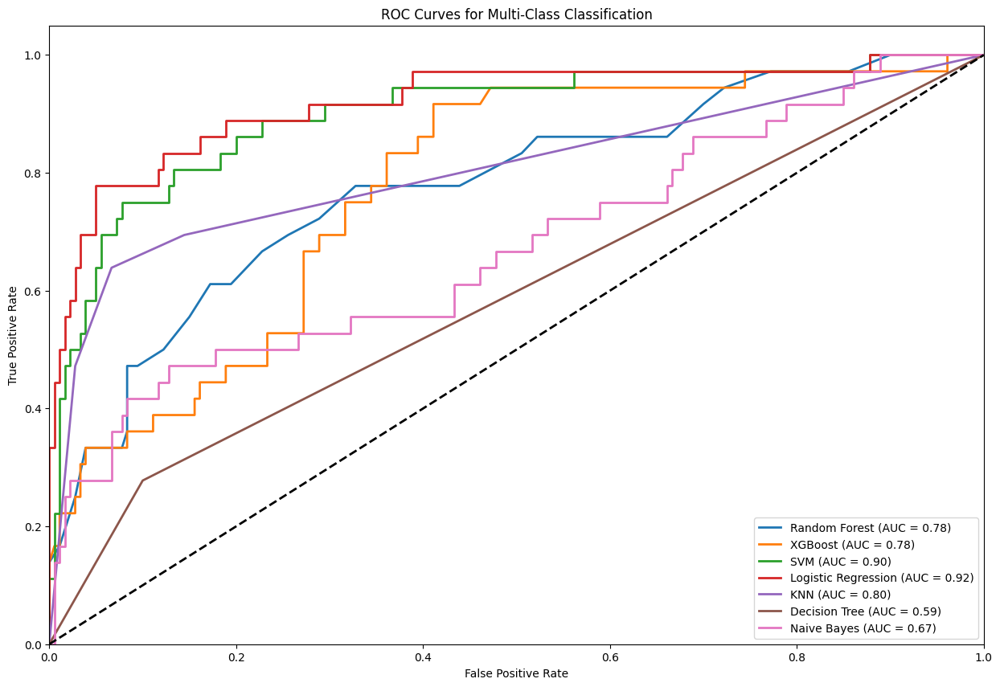

In [163]:
# Create a figure for the ROC curves
plt.figure(figsize=(15, 10))

for name, clf in classifiers.items():
    # Fit the classifier
    clf.fit(X_resampled, y_train_bin)

    # Get prediction probabilities (or decision function scores for SVM)
    if name == "SVM":
        y_score = clf.decision_function(X_test)
    else:
        y_score = clf.predict_proba(X_test)

    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Plot the ROC curve
    plt.plot(fpr["micro"], tpr["micro"],
             label=f'{name} (AUC = {roc_auc["micro"]:.2f})',
             linewidth=2)

plt.plot([0, 1], [0, 1], 'k--', linewidth=2)  # Diagonal line for random classifier
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Multi-Class Classification')
plt.legend(loc="lower right")
plt.show()

In [164]:
unlabeled_file_paths = labelled_data[labelled_data['CLUSTER ID'].isna()]['File Path']
unlabeled_file_paths.shape

(27,)

In [165]:
unlabeled_analyzer = testing()
unlabeled_analyzer.load_mfcc_files(unlabeled_file_paths)
unlabeled_feature_matrix, _ = unlabeled_analyzer.build_feature_matrix()

# Scale and reduce dimensionality using the fitted PCA from labeled data
scaler = StandardScaler()
unlabeled_scaled_features = scaler.fit_transform(unlabeled_feature_matrix)
unlabeled_reduced_features = analyzer1.pca_model.transform(unlabeled_scaled_features)

Processing file: 100%|██████████| 27/27 [00:19<00:00,  1.38it/s]


In [166]:
unlabeled_predictions = svm_classifier.predict(unlabeled_reduced_features)

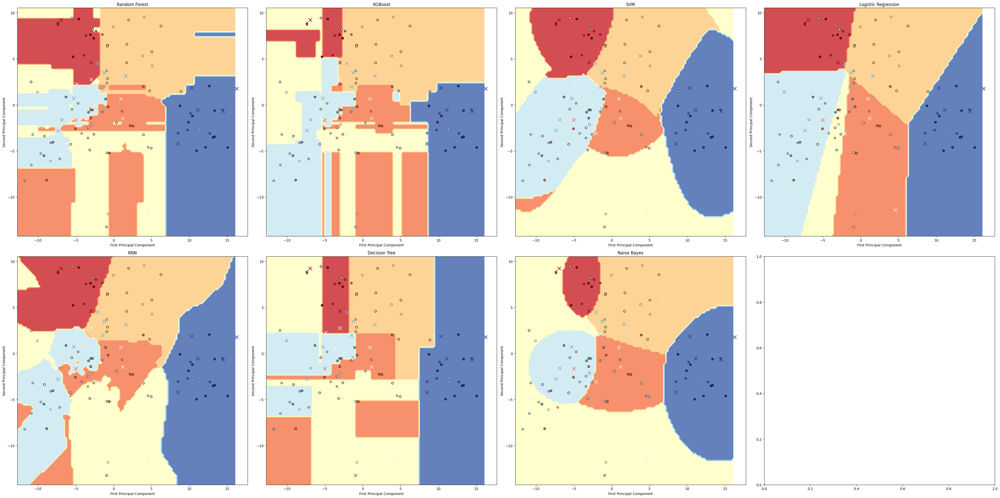

In [167]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.inspection import DecisionBoundaryDisplay

# Assuming you have your trained classifiers and X_train, X_test, y_train, y_test
classifiers = {
    "Random Forest": rf_classifier,
    "XGBoost": xgb_classifier,
    "SVM": svm_classifier,
    "Logistic Regression": logreg_classifier,
    "KNN": knn_classifier,
    "Decision Tree": dt_classifier,
    "Naive Bayes": nb_classifier,
}
for name, clf in classifiers.items():
    clf.fit(X_resampled[:,:2], y_resampled)
# Create a meshgrid for plotting the decision boundaries
x_min, x_max = reduced_features[:, 0].min() - 1, reduced_features[:, 0].max() + 1
y_min, y_max = reduced_features[:, 1].min() - 1, reduced_features[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                     np.arange(y_min, y_max, 0.1))

# Create a figure with subplots for each classifier
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(40, 20))
axes = axes.flatten()  # Flatten the axes array for easier iteration

for i, (name, clf) in enumerate(classifiers.items()):
    # Plot decision boundary
    disp = DecisionBoundaryDisplay.from_estimator(
        clf,
        reduced_features[:,:2],
        response_method="predict",
        cmap=plt.cm.RdYlBu,
        alpha=0.8,
        ax=axes[i],
        xlabel="First Principal Component",
        ylabel="Second Principal Component",
    )
    # Plot training and testing data
    axes[i].scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=plt.cm.RdYlBu, edgecolors="k")
    axes[i].scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=plt.cm.RdYlBu, edgecolors="k", alpha=0.6)
    axes[i].scatter(unlabeled_reduced_features[:, 0], unlabeled_reduced_features[:, 1], c=unlabeled_predictions, cmap=plt.cm.RdYlBu, marker='x', s=100, label='Unlabeled Predictions') # Add this line to include unlabeled points with 'x' marker
    axes[i].set_title(name)

plt.tight_layout()
plt.show()